In [1]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

In [2]:
def generate_simplex_vectors_with_projection(n):
    """
    Generate wave vectors of an n-dimensional regular simplex and 
    project them onto an n-dimensional space using orthogonal projection.
    
    When n=1, only retain a single wave direction.
    """
    if n == 1:
        return np.array([[1.0]])  # Only keep one direction in 1D
    
    # Create n+1 points, initially as an (n+1)-dimensional identity matrix
    points = np.eye(n+1)
    
    # Project onto an n-dimensional hyperplane: subtract the mean of each column to centralize
    points -= np.mean(points, axis=0)
    
    # Construct an n-dimensional orthonormal basis to reduce the dimensionality
    basis = np.linalg.svd(points.T)[0][:, :-1]  # Take the first n columns as the orthonormal basis
    reduced_vectors = points @ basis  # Project onto the n-dimensional space
    
    # Normalize the wave vectors
    reduced_vectors /= np.linalg.norm(reduced_vectors, axis=1, keepdims=True)
    
    return reduced_vectors

# Example: Construct a regular simplex wave vector in 2D space
n = 2
vectors = generate_simplex_vectors_with_projection(n)
print("Projected regular simplex wave vectors:\n", vectors)

# Verify the length of each wave vector
lengths = np.linalg.norm(vectors, axis=1)
print("\nLength of each wave vector:\n", lengths)

# Verify angles between vectors
cos_angles = vectors @ vectors.T
angles_in_degrees = np.degrees(np.arccos(cos_angles))

print("\nCosine matrix of angles between wave vectors:\n", cos_angles)
print("\nAngles between wave vectors (in degrees):\n", angles_in_degrees)

Projected regular simplex wave vectors:
 [[-1.00000000e+00  2.73558553e-17]
 [ 5.00000000e-01 -8.66025404e-01]
 [ 5.00000000e-01  8.66025404e-01]]

Length of each wave vector:
 [1. 1. 1.]

Cosine matrix of angles between wave vectors:
 [[ 1.  -0.5 -0.5]
 [-0.5  1.  -0.5]
 [-0.5 -0.5  1. ]]

Angles between wave vectors (in degrees):
 [[  0. 120. 120.]
 [120.   0. 120.]
 [120. 120.   0.]]


# 1d grid cell

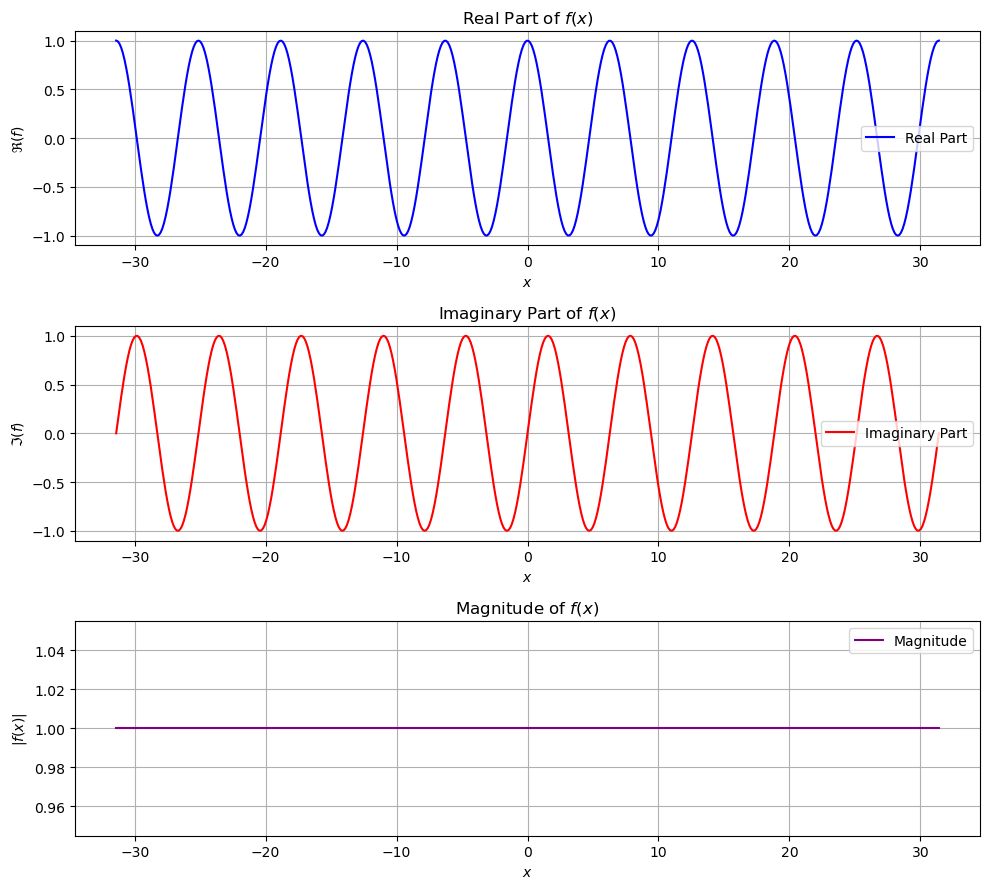

In [5]:
# Define the omega_i wave vectors in 1D space
omega = generate_simplex_vectors_with_projection(1)  # 1D simplex projection

# Define the 1D range
x = np.linspace(-10 * np.pi, 10 * np.pi, 500)

# Compute f(x) = sum(exp(j * (omega_i * x)))
f = np.zeros_like(x, dtype=complex)
for o in omega:
    f += np.exp(1j * (o[0] * x))

# Extract real part, imaginary part, and magnitude
real_f = np.real(f)
imag_f = np.imag(f)
magnitude_f = np.abs(f)

# Create visualizations
fig, ax = plt.subplots(3, 1, figsize=(10, 9))

# Real part plot
ax[0].plot(x, real_f, color='blue', label="Real Part")
ax[0].set_title("Real Part of $f(x)$")
ax[0].set_xlabel("$x$")
ax[0].set_ylabel("$\Re(f)$")
ax[0].legend()
ax[0].grid()

# Imaginary part plot
ax[1].plot(x, imag_f, color='red', label="Imaginary Part")
ax[1].set_title("Imaginary Part of $f(x)$")
ax[1].set_xlabel("$x$")
ax[1].set_ylabel("$\Im(f)$")
ax[1].legend()
ax[1].grid()

# Magnitude plot
ax[2].plot(x, magnitude_f, color='purple', label="Magnitude")
ax[2].set_title("Magnitude of $f(x)$")
ax[2].set_xlabel("$x$")
ax[2].set_ylabel("$|f(x)|$")
ax[2].legend()
ax[2].grid()

plt.tight_layout()
plt.show()

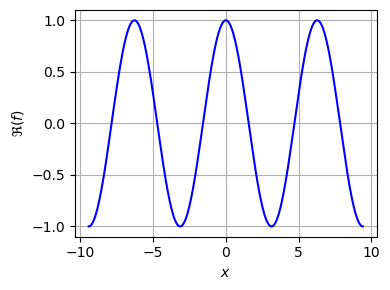

In [34]:
import numpy as np
import matplotlib.pyplot as plt

# Define the omega_i wave vectors in 1D space
omega = generate_simplex_vectors_with_projection(1)  # 1D simplex projection

# Define the 1D range
x = np.linspace(-3 * np.pi, 3 * np.pi, 500)

# Compute f(x) = sum(exp(j * (omega_i * x)))
f = np.zeros_like(x, dtype=complex)
for o in omega:
    f += np.exp(1j * (o[0] * x))

# Extract real part
real_f = np.real(f)

# Plot only the real part
plt.figure(figsize=(4, 3))
plt.plot(x, real_f, color='blue', label="Real Part")
plt.xlabel("$x$")
plt.ylabel(r"$\Re(f)$")
plt.grid(True)
# plt.title("Real Part of $f(x)$")
plt.tight_layout()
plt.show()

# 2d grid cell

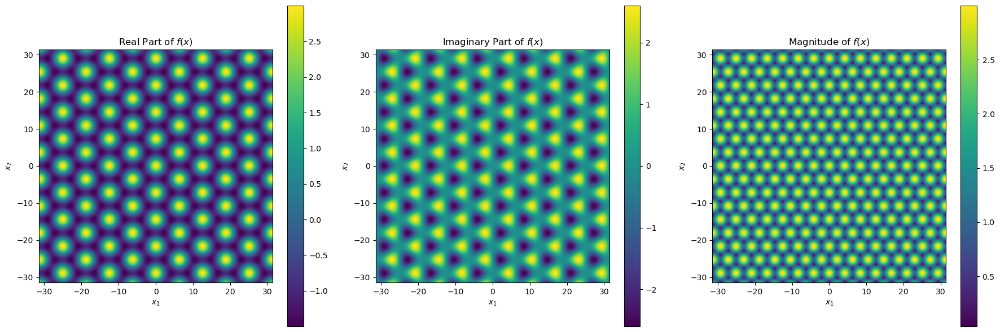

In [4]:
# Define the omega_i wave vectors in 2D space
omega = generate_simplex_vectors_with_projection(2)

# Define the range for the 2D grid
x1 = np.linspace(-10 * np.pi, 10 * np.pi, 200)
x2 = np.linspace(-10 * np.pi, 10 * np.pi, 200)
X1, X2 = np.meshgrid(x1, x2)

# Compute f(x) = sum(exp(j * (omega_i · x)))
f = np.zeros_like(X1, dtype=complex)
for o in omega:
    f += np.exp(1j * (o[0] * X1 + o[1] * X2))

# Extract real part, imaginary part, and magnitude
real_f = np.real(f)
imag_f = np.imag(f)
magnitude_f = np.abs(f)

# Create visualizations
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Real part plot
im1 = ax[0].imshow(real_f, extent=[x1.min(), x1.max(), x2.min(), x2.max()],
                   origin='lower', cmap='viridis')
ax[0].set_title("Real Part of $f(x)$")
ax[0].set_xlabel("$x_1$")
ax[0].set_ylabel("$x_2$")
fig.colorbar(im1, ax=ax[0])

# Imaginary part plot
im2 = ax[1].imshow(imag_f, extent=[x1.min(), x1.max(), x2.min(), x2.max()],
                   origin='lower', cmap='viridis')
ax[1].set_title("Imaginary Part of $f(x)$")
ax[1].set_xlabel("$x_1$")
ax[1].set_ylabel("$x_2$")
fig.colorbar(im2, ax=ax[1])

# Magnitude plot
im3 = ax[2].imshow(magnitude_f, extent=[x1.min(), x1.max(), x2.min(), x2.max()],
                   origin='lower', cmap='viridis')
ax[2].set_title("Magnitude of $f(x)$")
ax[2].set_xlabel("$x_1$")
ax[2].set_ylabel("$x_2$")
fig.colorbar(im3, ax=ax[2])

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os

# Create a folder to save images
os.makedirs("fx_scale_images", exist_ok=True)

# Generate 2D simplex-based frequency vectors (you need to define this function separately)
omega = generate_simplex_vectors_with_projection(2)

# Create a 2D grid
x1 = np.linspace(-10 * np.pi, 10 * np.pi, 200)
x2 = np.linspace(-10 * np.pi, 10 * np.pi, 200)
X1, X2 = np.meshgrid(x1, x2)

# Define different scale factors
scales = [1.0, 0.7, 0.5, 0.3, 0.1]

for scale in scales:
    scaled_omega = omega * scale

    # Compute f(x)
    f = np.zeros_like(X1, dtype=complex)
    for o in scaled_omega:
        f += np.exp(1j * (o[0] * X1 + o[1] * X2))

    real_f = np.real(f)

    # Plot the result
    plt.figure(figsize=(6, 5))
    plt.imshow(real_f, extent=[x1.min(), x1.max(), x2.min(), x2.max()],
               origin='lower', cmap='viridis')
    plt.title(f"Scale Factor = {scale}", fontsize=14)
    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$")
    plt.axis('off')  # Hide axes
    plt.tight_layout()

    # Save the figure
    save_path = f"fx_scale_images/fx_scale_{scale:.1f}.png"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.close()  # Close figure to free memory

print("✅ Done! One image saved per scale in the 'fx_scale_images/' folder.")

# 3d grid cell

In [ ]:
# Define wave vectors in four tetrahedral directions
omega = generate_simplex_vectors_with_projection(3)

# Define the 3D grid range
x = np.linspace(-4 * np.pi, 4 * np.pi, 100)
y = np.linspace(-4 * np.pi, 4 * np.pi, 100)
z = np.linspace(-4 * np.pi, 4 * np.pi, 100)
X, Y, Z = np.meshgrid(x, y, z)

# Compute the wave function
f = np.zeros_like(X, dtype=complex)
for o in omega:
    f += np.exp(1j * (o[0] * X + o[1] * Y + o[2] * Z))

# Extract the real part
real_f = np.real(f)

# Define a threshold to select only high-value regions (positive values) for point cloud visualization
threshold = 0.5 * np.max(real_f)
mask = real_f > threshold

# Generate point cloud data
x_points = X[mask].flatten()
y_points = Y[mask].flatten()
z_points = Z[mask].flatten()
values = real_f[mask].flatten()

# Create an interactive 3D plot
fig = go.Figure(data=[go.Scatter3d(
    x=x_points,
    y=y_points,
    z=z_points,
    mode='markers',
    marker=dict(
        size=3,
        color=values,
        colorscale='Viridis',
        opacity=0.1
    )
)])

fig.update_layout(
    title="3D Point Cloud of Real Part of $f(x)$",
    scene=dict(
        xaxis_title="X",
        yaxis_title="Y",
        zaxis_title="Z"
    )
)

import plotly.graph_objects as go
import plotly.io as pio

camera = dict(
    eye=dict(x=1.5, y=1.5, z=1.5)  
)

fig.update_layout(
    title="3D Point Cloud of Real Part of $f(x)$",
    scene=dict(
        xaxis_title="X",
        yaxis_title="Y",
        zaxis_title="Z"
    ),
    scene_camera=camera
)

pio.write_image(fig, "gridpe_3d_snapshot.png", width=800, height=600, scale=2)
print("Snapshot saved as gridpe_3d_snapshot.png")

fig.show()

Snapshot saved as gridpe_3d_snapshot.png
